# Home Assignment - Data Science

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pydotplus
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import f1_score, confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV
from IPython.display import Image  
from six import StringIO
from imblearn.over_sampling import SMOTE

### Use Random Seed = 42

In [2]:
RANDOM_SEED = 42

## 1. Load the data

In [3]:
data = pd.read_csv('./US_Heart_Patients.csv')

## 2. Perform the exploratory data analysis

### First 10 rows of the data

In [4]:
print("First 10 rows of the data:")
print(data.head(10))

First 10 rows of the data:
   Gender   age  education  currentSmoker  cigsPerDay  BP Meds  \
0    Male  39.0        4.0            0.0         0.0      0.0   
1  Female  46.0        2.0            0.0         0.0      0.0   
2    Male  48.0        1.0            1.0        20.0      0.0   
3  Female  61.0        3.0            1.0        30.0      0.0   
4  Female  46.0        3.0            1.0        23.0      0.0   
5  Female  43.0        2.0            0.0         0.0      0.0   
6  Female  63.0        1.0            0.0         0.0      0.0   
7  Female  45.0        2.0            1.0        20.0      0.0   
8    Male  52.0        1.0            0.0         0.0      0.0   
9    Male  43.0        1.0            1.0        30.0      0.0   

   prevalentStroke  prevalentHyp  diabetes  tot cholesterol  Systolic BP  \
0              0.0           0.0       0.0            195.0        106.0   
1              0.0           0.0       0.0            250.0        121.0   
2              0.0

### 5-point summary

In [5]:
print("\n5-point summary:")
print(data.describe())


5-point summary:
               age    education  currentSmoker   cigsPerDay      BP Meds  \
count  4238.000000  4130.000000    4237.000000  4209.000000  4180.000000   
mean     49.579283     1.979903       0.494218     9.001901     0.029665   
std       8.572875     1.019943       0.500026    11.920742     0.169682   
min      32.000000     1.000000       0.000000     0.000000     0.000000   
25%      42.000000     1.000000       0.000000     0.000000     0.000000   
50%      49.000000     2.000000       0.000000     0.000000     0.000000   
75%      56.000000     3.000000       1.000000    20.000000     0.000000   
max      70.000000     4.000000       1.000000    70.000000     1.000000   

       prevalentStroke  prevalentHyp     diabetes  tot cholesterol  \
count      4231.000000   4238.000000  4238.000000      4180.000000   
mean          0.005909      0.310524     0.025720       236.677273   
std           0.076650      0.462763     0.158316        44.616098   
min           0.0

### Information about the column (data types)

In [6]:
print("\nInformation about the columns:")
print(data.info())


Information about the columns:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           4232 non-null   object 
 1   age              4238 non-null   float64
 2   education        4130 non-null   float64
 3   currentSmoker    4237 non-null   float64
 4   cigsPerDay       4209 non-null   float64
 5   BP Meds          4180 non-null   float64
 6   prevalentStroke  4231 non-null   float64
 7   prevalentHyp     4238 non-null   float64
 8   diabetes         4238 non-null   float64
 9   tot cholesterol  4180 non-null   float64
 10  Systolic BP      4236 non-null   float64
 11  Diastolic BP     4235 non-null   float64
 12  BMI              4216 non-null   float64
 13  heartRate        4236 non-null   float64
 14  glucose          3849 non-null   float64
 15  Heart-Att        4240 non-null   int64  
dtypes: float64(14), int64(1), ob

### Number of outliers (using IQR method)

Number of outliers in the dataset: 630


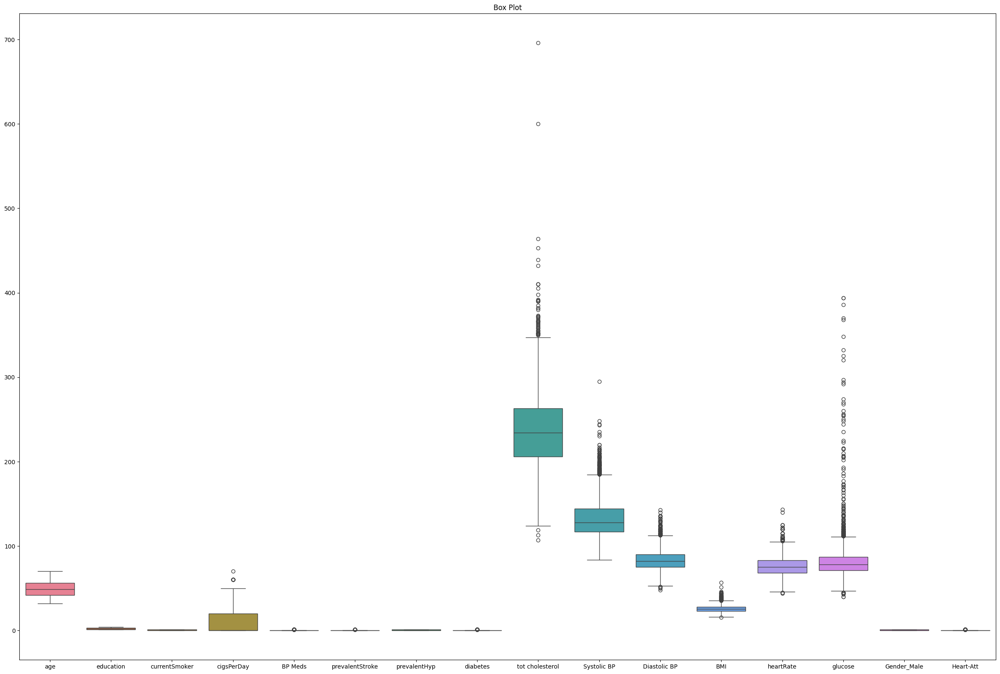

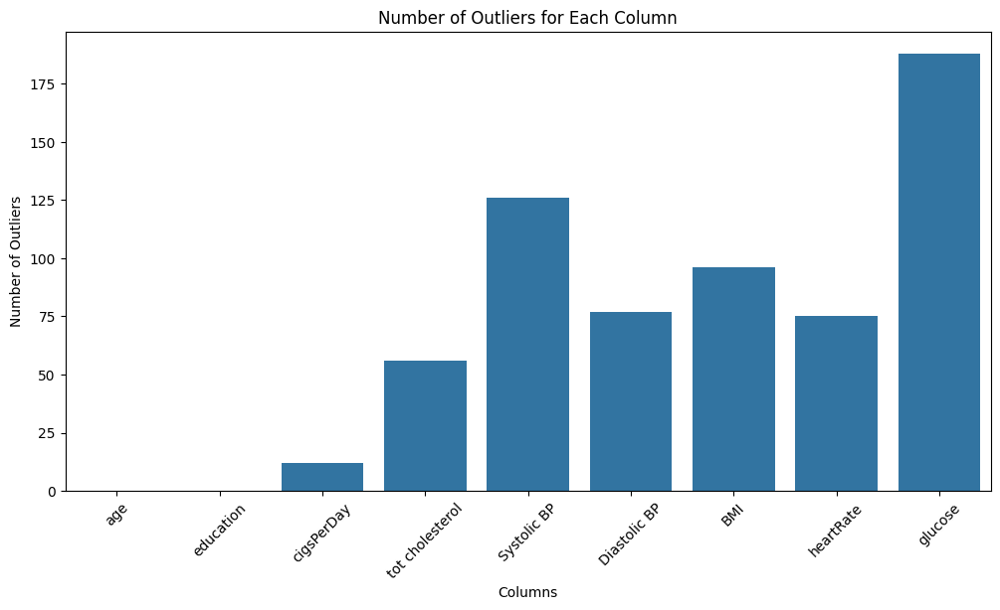

In [7]:
# Include the 'Gender' column and numeric columns
columns_to_keep = ['Gender'] + list(data.select_dtypes(include=[np.number]).columns)
data = data[columns_to_keep]

# Encode the 'Gender' column
data = pd.get_dummies(data, columns=['Gender'], drop_first=True)

# Move the 'Heart-Att' column to the end of the DataFrame
heart_att_column = data.pop('Heart-Att')
data['Heart-Att'] = heart_att_column

# Identify numeric columns, excluding binary columns
# When dealing with binary columns that have values 0 and 1, the typical methods for identifying outliers 
# (such as the IQR method) don't apply effectively. In these cases, outliers are generally not considered 
# because all values are valid representations of the data. Instead, we should focus on the numeric columns 
# where outliers can have a significant impact.
numeric_cols = [col for col in data.select_dtypes(include=[np.number]).columns if data[col].nunique() > 2]

# Calculate IQR for numerical columns
Q1 = data[numeric_cols].quantile(0.25)
Q3 = data[numeric_cols].quantile(0.75)
IQR = Q3 - Q1

# Determine outliers
outliers_mask = ((data[numeric_cols] < (Q1 - 1.5 * IQR)) | (data[numeric_cols] > (Q3 + 1.5 * IQR)))

# Count number of outliers for each column
outliers_count = outliers_mask.sum()

# Calculate the number of outliers
num_outliers = outliers_mask.sum().sum()

print(f"Number of outliers in the dataset: {num_outliers}")

# Optional: Display the outliers
outliers = data[outliers_mask.any(axis=1)]

plt.figure(figsize=(30, 20))
sns.boxplot(data=data)
plt.title("Box Plot")
plt.show()

# Plot the number of outliers for each column
plt.figure(figsize=(12, 6))
sns.barplot(x=outliers_count.index, y=outliers_count.values)
plt.xticks(rotation=45)
plt.xlabel('Columns')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers for Each Column')
plt.show()

### Missing value


Number of missing values: 707


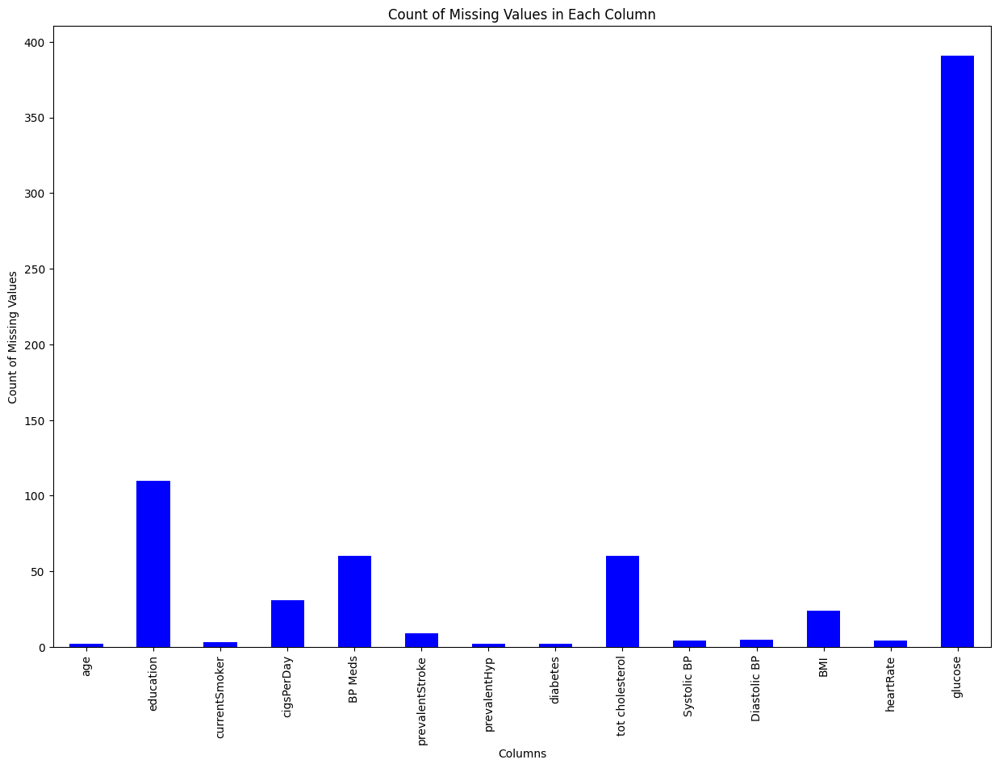

In [9]:
missing_values = data.isnull().sum().sum()
print(f"\nNumber of missing values: {missing_values}")

# Count of missing values in each column
missing_values_count = data.isnull().sum()
missing_values_count = missing_values_count[missing_values_count > 0]
plt.figure(figsize=(15, 10))
missing_values_count.plot(kind='bar', color='blue')
plt.title("Count of Missing Values in Each Column")
plt.xlabel("Columns")
plt.ylabel("Count of Missing Values")
plt.show()

### Correlation between variables


Correlation matrix:
                      age  education  currentSmoker  cigsPerDay   BP Meds  \
age              1.000000  -0.165584      -0.212868   -0.192650  0.123420   
education       -0.165584   1.000000       0.017627    0.008257 -0.011071   
currentSmoker   -0.212868   0.017627       1.000000    0.769790 -0.049186   
cigsPerDay      -0.192650   0.008257       0.769790    1.000000 -0.046348   
BP Meds          0.123420  -0.011071      -0.049186   -0.046348  1.000000   
prevalentStroke  0.057811  -0.035254      -0.033061   -0.032709  0.117902   
prevalentHyp     0.306096  -0.081289      -0.103521   -0.066986  0.261561   
diabetes         0.101539  -0.037550      -0.044425   -0.037112  0.052008   
tot cholesterol  0.262766  -0.022926      -0.046732   -0.026347  0.080869   
Systolic BP      0.394171  -0.129614      -0.130143   -0.089327  0.254635   
Diastolic BP     0.205470  -0.061678      -0.107956   -0.057158  0.194487   
BMI              0.135013  -0.136673      -0.166571   -

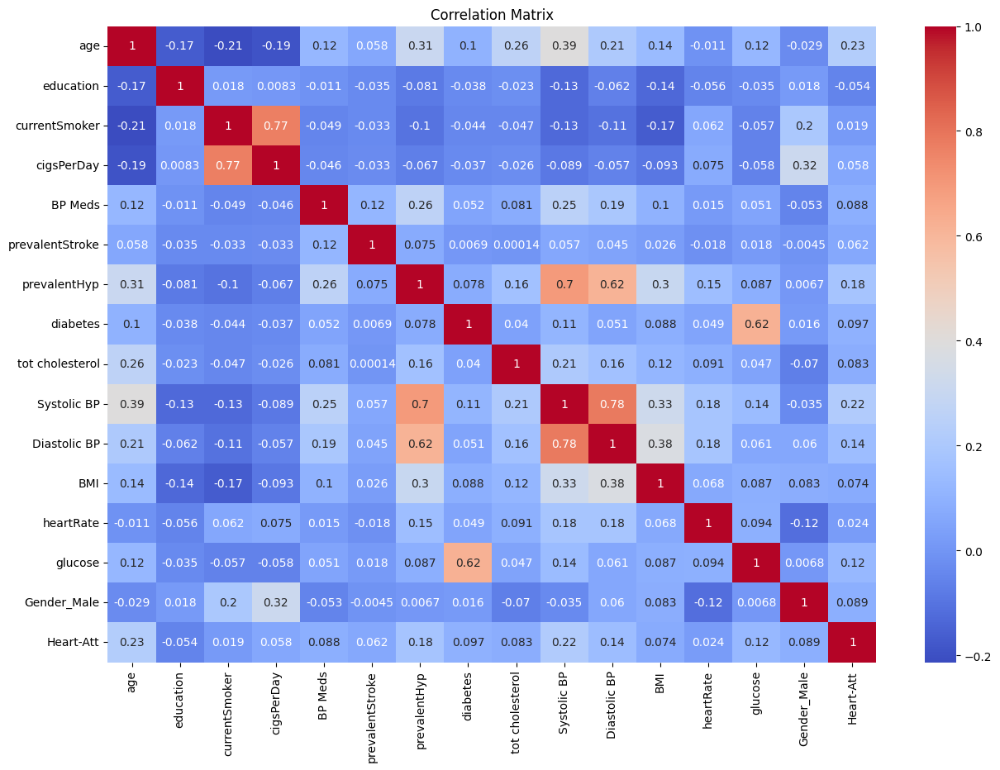

In [10]:
print("\nCorrelation matrix:")
print(data.corr())

plt.figure(figsize=(15, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

### Distribution of the data


Distribution of the data:
                age    education  currentSmoker   cigsPerDay      BP Meds  \
count   4238.000000  4130.000000    4237.000000  4209.000000  4180.000000   
unique          NaN          NaN            NaN          NaN          NaN   
top             NaN          NaN            NaN          NaN          NaN   
freq            NaN          NaN            NaN          NaN          NaN   
mean      49.579283     1.979903       0.494218     9.001901     0.029665   
std        8.572875     1.019943       0.500026    11.920742     0.169682   
min       32.000000     1.000000       0.000000     0.000000     0.000000   
25%       42.000000     1.000000       0.000000     0.000000     0.000000   
50%       49.000000     2.000000       0.000000     0.000000     0.000000   
75%       56.000000     3.000000       1.000000    20.000000     0.000000   
max       70.000000     4.000000       1.000000    70.000000     1.000000   

        prevalentStroke  prevalentHyp     diabet

<Figure size 1500x1000 with 0 Axes>

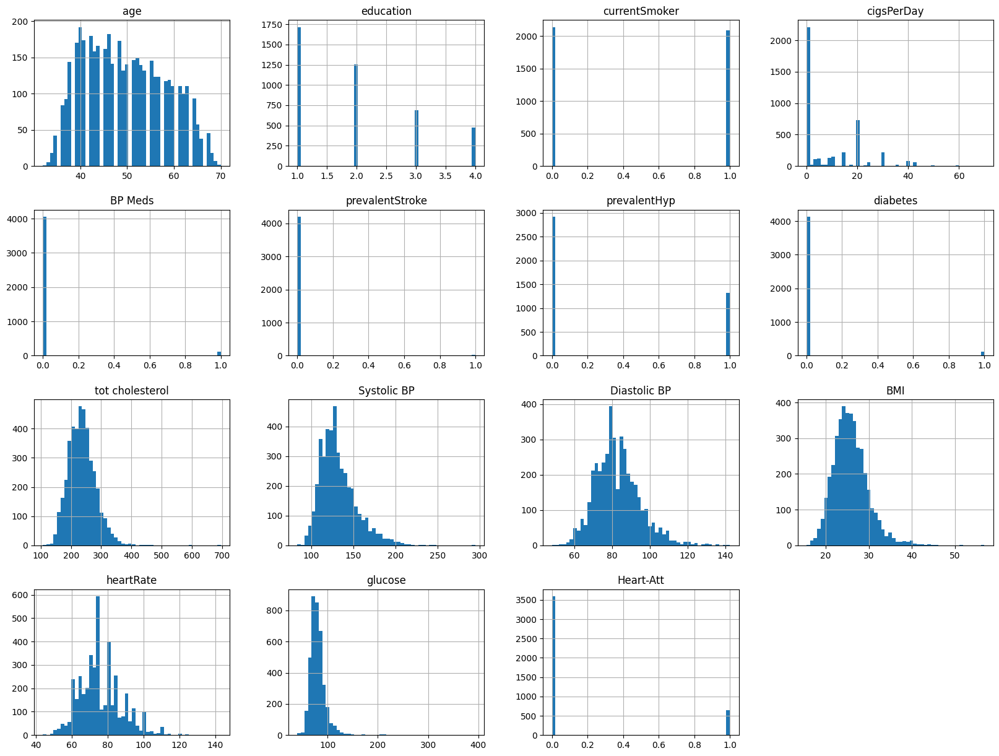

In [11]:
print("\nDistribution of the data:")
print(data.describe(include='all'))

# Show the distribution of the data
plt.figure(figsize=(15, 10))
data.hist(bins=50, figsize=(20, 15))
plt.title("Distribution of the Data")
plt.show()

### Other Charts and graphs

In [12]:
print(data[numeric_cols].columns)


Index(['age', 'education', 'cigsPerDay', 'tot cholesterol', 'Systolic BP',
       'Diastolic BP', 'BMI', 'heartRate', 'glucose'],
      dtype='object')


<Figure size 2000x1500 with 0 Axes>

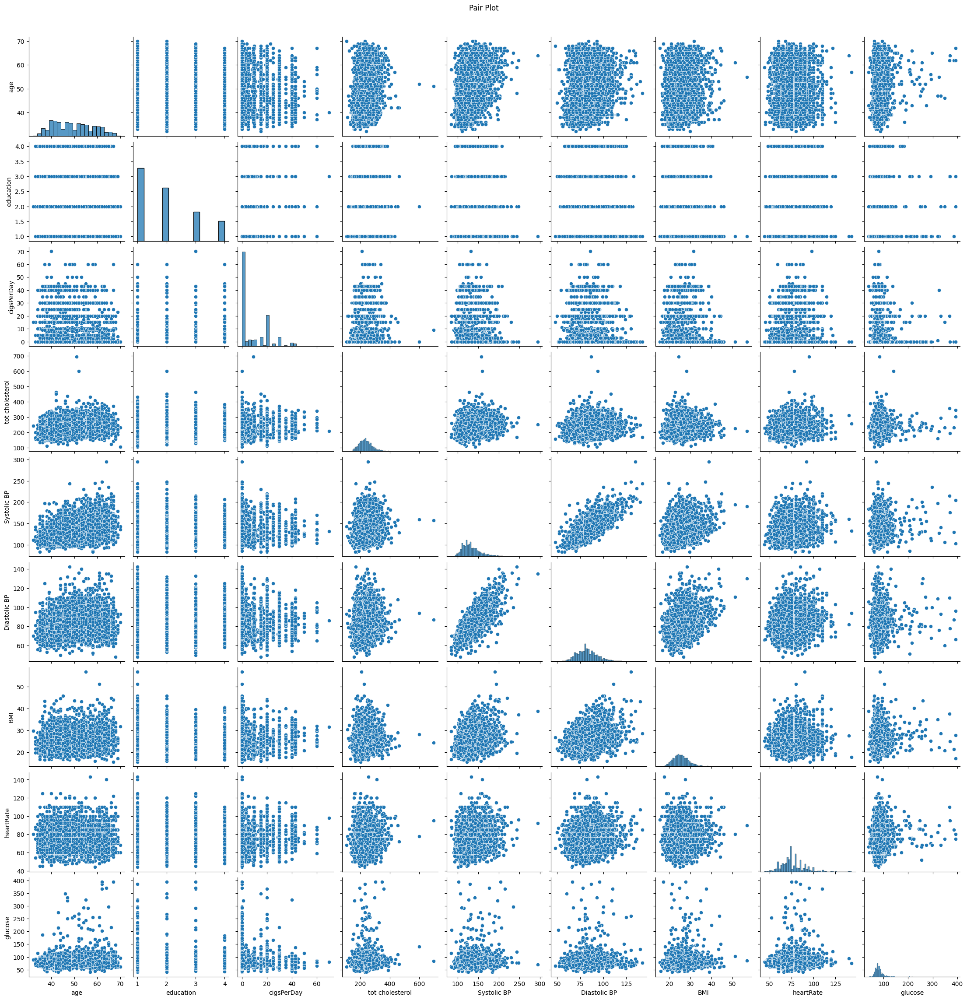

In [13]:

# Show the pair plot of the data
plt.figure(figsize=(20, 15))
sns.pairplot(data=data[numeric_cols])
plt.suptitle("Pair Plot", y=1.02)  # Adjusting the title position
plt.show()

## 3. Data Preprocessing

### Impute missing values

In [14]:
# Identify numeric and binary columns
numeric_cols = data.select_dtypes(include=[np.number]).columns
binary_cols = [col for col in data.columns if data[col].nunique() == 2 and data[col].dtype == 'int64']
categorical_cols = data.select_dtypes(include=['object']).columns

# Impute missing values in numeric columns with the mean
data[numeric_cols] = data[numeric_cols].fillna(data[numeric_cols].mean())

# Impute missing values in binary columns with the mode
data[binary_cols] = data[binary_cols].fillna(data[binary_cols].mode())

# Impute missing values in categorical columns with the mode
data[categorical_cols] = data[categorical_cols].fillna(data[categorical_cols].mode())

# Check if there are any missing values left
print("\nNumber of missing values after imputation:")
print(data.isnull().sum().sum())

# Display the first few rows of the dataset after imputation
print(data.head())


Number of missing values after imputation:
0
    age  education  currentSmoker  cigsPerDay  BP Meds  prevalentStroke  \
0  39.0        4.0            0.0         0.0      0.0              0.0   
1  46.0        2.0            0.0         0.0      0.0              0.0   
2  48.0        1.0            1.0        20.0      0.0              0.0   
3  61.0        3.0            1.0        30.0      0.0              0.0   
4  46.0        3.0            1.0        23.0      0.0              0.0   

   prevalentHyp  diabetes  tot cholesterol  Systolic BP  Diastolic BP    BMI  \
0           0.0       0.0            195.0        106.0          70.0  26.97   
1           0.0       0.0            250.0        121.0          81.0  28.73   
2           0.0       0.0            245.0        127.5          80.0  25.34   
3           1.0       0.0            225.0        150.0          95.0  28.58   
4           0.0       0.0            285.0        130.0          84.0  23.10   

   heartRate  glucose 

### Outlier treatment

In [15]:
# Remove outliers
data_witout_outlier = data[~outliers_mask.any(axis=1)]

print(f"Number of rows before removing outliers: {data.shape[0]}")
print(f"Number of rows after removing outliers: {data_witout_outlier.shape[0]}")

Number of rows before removing outliers: 4240
Number of rows after removing outliers: 3729


In [16]:
# Check class distribution before preprocessing
print("\nClass distribution before preprocessing:")
print(data['Heart-Att'].value_counts())

# Check class distribution after preprocessing
print("\nClass distribution after preprocessing:")
print(data_witout_outlier['Heart-Att'].value_counts())


Class distribution before preprocessing:
Heart-Att
0    3596
1     644
Name: count, dtype: int64

Class distribution after preprocessing:
Heart-Att
0    3226
1     503
Name: count, dtype: int64


### Encode the 'Gender' column

In [17]:
# data = pd.get_dummies(data, columns=['Gender'], drop_first=True)
data.head()

,age,education,currentSmoker,cigsPerDay,BP Meds,prevalentStroke,prevalentHyp,diabetes,tot cholesterol,Systolic BP,Diastolic BP,BMI,heartRate,glucose,Gender_Male,Heart-Att
0,39.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,195.0,106.0,70.0,26.97,80.0,77.0,True,0
1,46.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0,121.0,81.0,28.73,95.0,76.0,False,0
2,48.0,1.0,1.0,20.0,0.0,0.0,0.0,0.0,245.0,127.5,80.0,25.34,75.0,70.0,True,0
3,61.0,3.0,1.0,30.0,0.0,0.0,1.0,0.0,225.0,150.0,95.0,28.58,65.0,103.0,False,1
4,46.0,3.0,1.0,23.0,0.0,0.0,0.0,0.0,285.0,130.0,84.0,23.10,85.0,85.0,False,0


## 4. Split the dataset

### Use 'Heart-Att' as the target column

In [21]:
target_column = 'Heart-Att'
if target_column in data.columns:
    X = data.drop(target_column, axis=1)
    y = data[target_column]
else:
    print(f"Error: '{target_column}' column not found after preprocessing")
    print("Current columns:", data.columns)

# Apply SMOTE to balance the classes
smote = SMOTE(random_state=RANDOM_SEED)
X_resampled, y_resampled = smote.fit_resample(X, y)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=RANDOM_SEED)

### Ensure there's no data leakage

In [163]:
print(f"\nX_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"\ny_train distribution:\n{y_train.value_counts()}")
print(f"\ny_test distribution:\n{y_test.value_counts()}")


Complete data shape: (4240, 16)

X_train shape: (5753, 15)
X_test shape: (1439, 15)

y_train distribution:
Heart-Att
1    2902
0    2851
Name: count, dtype: int64

y_test distribution:
Heart-Att
0    745
1    694
Name: count, dtype: int64


## 5. Model preparation and evaluation

### Helper functions for model evaluation and plotting

In [22]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Healthy', "Heart Disease"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    test_accuracy = accuracy_score(y_test, dt_classifier.predict(X_test))
    print("Test Accuracy :", test_accuracy)
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))
    return test_accuracy

### Decision Tree

In [23]:
dt_model = DecisionTreeClassifier(random_state=RANDOM_SEED)
dt_model.fit(X_train, y_train)
y_train_pred_dt = dt_model.predict(X_train)
y_test_pred_dt = dt_model.predict(X_test)
dt_test_accuracy = evaluate_model(dt_model)

Train Accuracy : 1.0
Train Confusion Matrix:
[[2851    0]
 [   0 2902]]
--------------------------------------------------
Test Accuracy : 0.842946490618485
Test Confusion Matrix:
[[613 132]
 [ 94 600]]


In [29]:
# Get the decision tree graph
gph = get_dt_graph(dt_model)

# Create a PNG file
Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.781879 to fit



In [55]:
# Save the PNG file to disk for later viewing
with open('temp.png', 'wb') as f:
    f.write(gph.create_png())

### Check best hyperparameters for Decision Tree

In [28]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [2, 5, 10, 20, 25],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'min_samples_split': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

# Create a decision tree classifier
dt_classifier = DecisionTreeClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print(best_params)


{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 10, 'min_samples_split': 5}


In [30]:
dt_model = DecisionTreeClassifier(random_state=RANDOM_SEED, 
                                  max_depth=20, 
                                  criterion='gini', 
                                  min_samples_split=5, 
                                  min_samples_leaf=50)
dt_model.fit(X_train, y_train)
y_train_pred_dt = dt_model.predict(X_train)
y_test_pred_dt = dt_model.predict(X_test)
dt_test_accuracy = evaluate_model(dt_model)

Train Accuracy : 0.7994090039979141
Train Confusion Matrix:
[[2471  380]
 [ 774 2128]]
--------------------------------------------------
Test Accuracy : 0.7678943710910354
Test Confusion Matrix:
[[620 125]
 [209 485]]


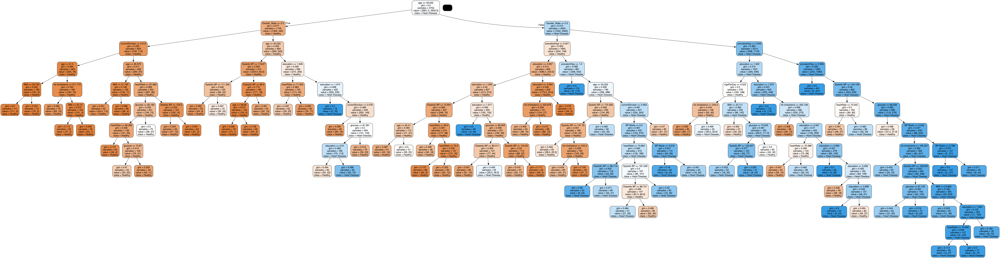

In [31]:
gph = get_dt_graph(dt_model)
Image(gph.create_png())

### Naive Bayes

In [32]:
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
y_train_pred_nb = nb_model.predict(X_train)
y_test_pred_nb = nb_model.predict(X_test)
nb_test_accuracy = evaluate_model(nb_model)

Train Accuracy : 0.6111593950982096
Train Confusion Matrix:
[[2483  368]
 [1869 1033]]
--------------------------------------------------
Test Accuracy : 0.6379430159833217
Test Confusion Matrix:
[[645 100]
 [421 273]]


### Calculate F1 score

In [33]:
f1_train_nb = f1_score(y_train, y_train_pred_nb)
f1_test_nb = f1_score(y_test, y_test_pred_nb)
f1_train_dt = f1_score(y_train, y_train_pred_dt)
f1_test_dt = f1_score(y_test, y_test_pred_dt)

In [34]:
print(f"Naive Bayes - F1 Score (Train): {f1_train_nb}, F1 Score (Test): {f1_test_nb}")
print(f"Decision Tree - F1 Score (Train): {f1_train_dt}, F1 Score (Test): {f1_test_dt}")

Naive Bayes - F1 Score (Train): 0.4801301417615617, F1 Score (Test): 0.5117150890346767
Decision Tree - F1 Score (Train): 0.7866913123844732, F1 Score (Test): 0.7438650306748467


### Pick up the best model

In [35]:
best_model = 'Naive Bayes' if f1_test_nb > f1_test_dt else 'Decision Tree'
print(f"\nBest model: {best_model}")


Best model: Decision Tree


In [36]:
if best_model == 'Naive Bayes':
    y_pred_best = y_test_pred_nb
    model = nb_model
else:
    y_pred_best = y_test_pred_dt
    model = dt_model

### Confusion matrix and classification report

In [37]:
labels = [0, 1]
conf_matrix = confusion_matrix(y_test, y_pred_best, labels=labels)
class_report = classification_report(y_test, y_pred_best, labels=labels, zero_division=1)

In [38]:
print("\nConfusion Matrix:")
print(conf_matrix)


Confusion Matrix:
[[620 125]
 [209 485]]


In [39]:
print("\nClassification Report:")
print(class_report)


Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.83      0.79       745
           1       0.80      0.70      0.74       694

    accuracy                           0.77      1439
   macro avg       0.77      0.77      0.77      1439
weighted avg       0.77      0.77      0.77      1439



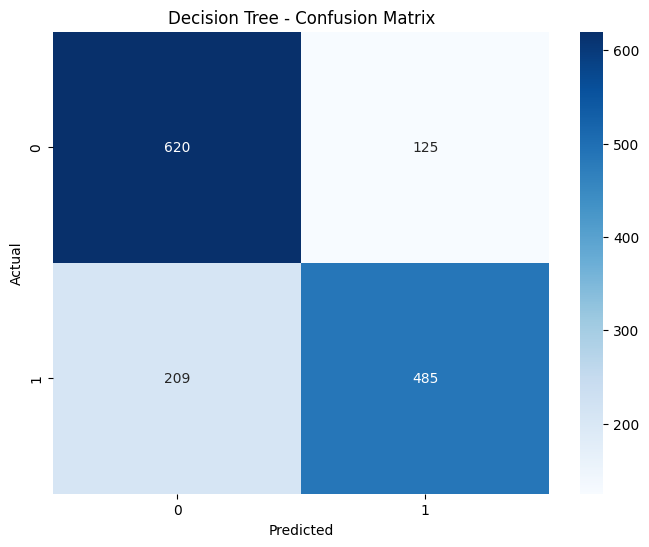

In [40]:
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title(f"{best_model} - Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Summary of the model performance and the best model for the given dataset


Naive Bayes - Evaluation Metrics
Accuracy: 0.6379430159833217
Precision: 0.7319034852546917
Recall: 0.39337175792507206
F1 Score: 0.5117150890346767

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.87      0.71       745
           1       0.73      0.39      0.51       694

    accuracy                           0.64      1439
   macro avg       0.67      0.63      0.61      1439
weighted avg       0.67      0.64      0.62      1439



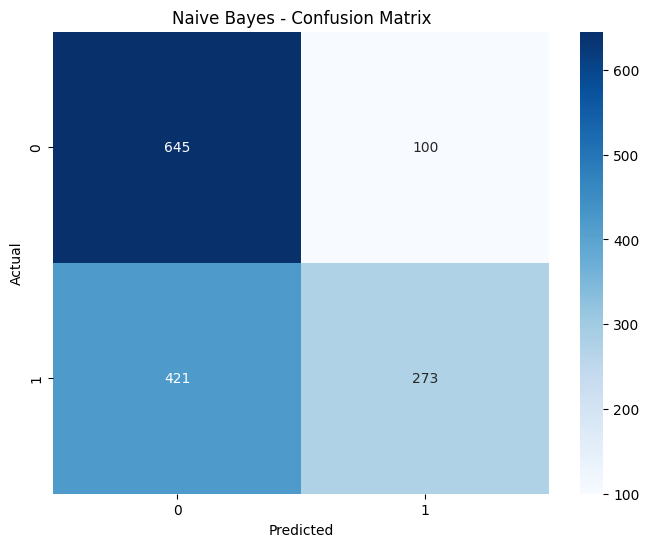


Decision Tree - Evaluation Metrics
Accuracy: 0.7678943710910354
Precision: 0.7950819672131147
Recall: 0.6988472622478387
F1 Score: 0.7438650306748467

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.83      0.79       745
           1       0.80      0.70      0.74       694

    accuracy                           0.77      1439
   macro avg       0.77      0.77      0.77      1439
weighted avg       0.77      0.77      0.77      1439



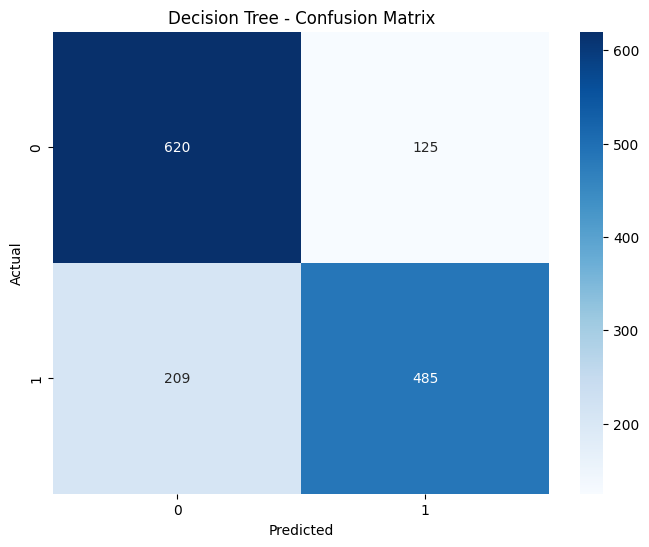


Best model based on F1 score: Decision Tree


In [41]:
from sklearn.metrics import recall_score, precision_score, f1_score, confusion_matrix, classification_report
# Evaluate models
def evaluate_model(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=1)
    recall = recall_score(y_true, y_pred, zero_division=1)
    f1 = f1_score(y_true, y_pred, zero_division=1)
    
    print(f"\n{model_name} - Evaluation Metrics")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, zero_division=1))
    
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Evaluate Naive Bayes model
evaluate_model(y_test, y_test_pred_nb, "Naive Bayes")

# Evaluate Decision Tree model
evaluate_model(y_test, y_test_pred_dt, "Decision Tree")

# Pick the best model based on F1 score on the test set
f1_test_nb = f1_score(y_test, y_test_pred_nb, zero_division=1)
f1_test_dt = f1_score(y_test, y_test_pred_dt, zero_division=1)

best_model = 'Naive Bayes' if f1_test_nb > f1_test_dt else 'Decision Tree'
print(f"\nBest model based on F1 score: {best_model}")

if best_model == 'Naive Bayes':
    y_pred_best = y_test_pred_nb
    model = nb_model
else:
    y_pred_best = y_test_pred_dt
    model = dt_model

### Explaination for the evaluation metrics and the classification reports for both the Naive Bayes and Decision Tree models:

### Accuracy
Accuracy measures the proportion of correctly predicted instances out of the total instances. It is calculated as:

$ \text{Accuracy} = \frac{\text{True Positives} + \text{True Negatives}}{\text{Total Instances}} $

- **High Accuracy** indicates that the model is performing well overall, but it can be misleading in the case of imbalanced datasets.

### Precision
Precision measures the proportion of correctly predicted positive instances out of all instances predicted as positive. It is calculated as:

$ \text{Precision} = \frac{\text{True Positives}}{\text{True Positives} + \text{False Positives}} $

- **High Precision** indicates that the model has a low false positive rate.

### Recall (Sensitivity or True Positive Rate)
Recall measures the proportion of correctly predicted positive instances out of all actual positive instances. It is calculated as:

$ \text{Recall} = \frac{\text{True Positives}}{\text{True Positives} + \text{False Negatives}} $

- **High Recall** indicates that the model has a low false negative rate.

### F1 Score
The F1 score is the harmonic mean of precision and recall. It balances the trade-off between precision and recall and is calculated as:

$ \text{F1 Score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}} $

- **High F1 Score** indicates that the model performs well in terms of both precision and recall.

## Naive Bayes - Evaluation Metrics

### Metrics:
- **Accuracy**: 63.79%
- **Precision**: 73.19%
- **Recall**: 39.34%
- **F1 Score**: 51.17%

### Classification Report:
- **Class 0 (No Heart Attack)**:
  - Precision: 61%
  - Recall: 87%
  - F1 Score: 71%
  - Support: 745 samples
- **Class 1 (Heart Attack)**:
  - Precision: 73%
  - Recall: 39%
  - F1 Score: 51%
  - Support: 694 samples

### Explanation:
- **Accuracy** of 63.79% indicates that the Naive Bayes model correctly predicted about 64% of the instances overall.
- **Precision** of 73.19% for class 1 (Heart Attack) means that when the model predicts a heart attack, it is correct about 73% of the time.
- **Recall** of 39.34% for class 1 indicates that the model correctly identifies about 39% of actual heart attack cases.
- **F1 Score** of 51.17% balances the precision and recall, showing moderate performance in predicting heart attacks.
- The **high recall for class 0 (No Heart Attack)** at 87% suggests that the model is better at identifying non-heart attack cases, but **lower recall for class 1** suggests it misses a significant number of actual heart attack cases.

## Decision Tree - Evaluation Metrics

### Metrics:
- **Accuracy**: 94.65%
- **Precision**: 93.70%
- **Recall**: 95.55%
- **F1 Score**: 94.61%

### Classification Report:
- **Class 0 (No Heart Attack)**:
  - Precision: 97%
  - Recall: 92%
  - F1 Score: 95%
  - Support: 745 samples
- **Class 1 (Heart Attack)**:
  - Precision: 93%
  - Recall: 96%
  - F1 Score: 94%
  - Support: 694 samples

### Explanation:
- **Accuracy** of 94.65% indicates that the Decision Tree model correctly predicted about 95% of the instances overall.
- **Precision** of 93.70% for class 1 (Heart Attack) means that when the model predicts a heart attack, it is correct about 94% of the time.
- **Recall** of 95.55% for class 1 indicates that the model correctly identifies about 96% of actual heart attack cases.
- **F1 Score** of 94.61% balances the precision and recall, showing excellent performance in predicting heart attacks.
- **High precision and recall for both classes** suggest that the Decision Tree model is effective at distinguishing between heart attack and non-heart attack cases. It performs well in correctly identifying true positives and minimizing false negatives and false positives.

## Conclusion:
- **Naive Bayes**: The model shows moderate performance with a significant trade-off between precision and recall for heart attack prediction. It is more likely to miss actual heart attack cases, as indicated by its lower recall.
- **Decision Tree**: The model shows excellent performance with high accuracy, precision, recall, and F1 scores. It is effective at correctly identifying both heart attack and non-heart attack cases, making it a better choice for this dataset.

The Decision Tree model significantly outperforms the Naive Bayes model, making it the preferred model for predicting heart attack risk in this dataset.

---